# End-to-End Architecture Performance Comparisons

In [1]:
# System imports
import os
import sys
from pprint import pprint as pp
from time import time as tt
import inspect
import importlib

# External imports
import matplotlib.pyplot as plt
import matplotlib.colors
import scipy as sp
from sklearn.decomposition import PCA
from sklearn.metrics import auc
import numpy as np
import pandas as pd
import seaborn as sns
import torch
from torch_geometric.data import DataLoader
from mpl_toolkits.mplot3d import Axes3D

from itertools import chain

from torch.nn import Linear
import torch.nn.functional as F
from torch_scatter import scatter, segment_csr, scatter_add
from torch_geometric.nn.conv import MessagePassing
from torch_cluster import knn_graph, radius_graph
import trackml.dataset
import torch_geometric
from itertools import permutations
import itertools
import plotly.express as px

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

from sklearn.cluster import DBSCAN
from sklearn import metrics

# Limit CPU usage on Jupyter
os.environ['OMP_NUM_THREADS'] = '4'

# Pick up local packages
sys.path.append('..')

# Local imports
from prepare_utils import *
from performance_utils import *
from toy_utils import *
from models import *
from trainers import *
%matplotlib inline


# Get rid of RuntimeWarnings, gross
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
import wandb
import faiss
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
torch_seed = 0

In [72]:
importlib.reload(sys.modules['toy_utils'])
from performance_utils import *

In [32]:
importlib.reload(sys.modules['models'])
from models import *

## Data Preparation

### Load & Save Raw Data

Load events:

In [63]:
save_dir = "/global/cscratch1/sd/danieltm/ExaTrkX/trackml_processed/"
load_path = os.path.join(save_dir, str(pt_cut) + "_pt_cut_endcaps/all_events")
all_events = os.listdir(load_path)
all_events = [os.path.join(load_path, event) for event in all_events]
np.random.shuffle(all_events)

basename = os.path.join(save_dir, str(pt_cut) + "_pt_cut_endcaps")
os.makedirs(basename, exist_ok=True)

In [64]:
pt_cut = 0.5
train_number = 1000
test_number = 100

In [65]:
%%time
train_dataset = [torch.load(event) for event in all_events[:train_number]]
test_dataset = [torch.load(event) for event in all_events[-test_number:]]

CPU times: user 2.73 s, sys: 1min 18s, total: 1min 20s
Wall time: 2min 11s


In [66]:
with open(os.path.join(basename, str(train_number) + "_events_train"), 'wb') as pickle_file:
#     pickle.dump(train_dataset, pickle_file)
    torch.save(train_dataset, pickle_file)
with open(os.path.join(basename, str(test_number) + "_events_test"), 'wb') as pickle_file:
#     pickle.dump(train_dataset, pickle_file)
    torch.save(test_dataset, pickle_file)

### Load Scrubbed Events

In [2]:
pt_cut = 0.5
train_number = 1000
test_number = 100
load_dir = "/global/cscratch1/sd/danieltm/ExaTrkX/trackml_processed/"
train_path = os.path.join(load_dir, str(pt_cut) + "_pt_cut_endcaps", str(train_number) + "_events_train")
test_path = os.path.join(load_dir, str(pt_cut) + "_pt_cut_endcaps", str(test_number) + "_events_test")

In [3]:
%%time 
train_dataset = torch.load(train_path)
test_dataset = torch.load(test_path)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

CPU times: user 63.9 ms, sys: 1.92 s, total: 1.98 s
Wall time: 2.32 s


# Baseline Architectures

We begin by exploring manually tuned stages of the pipeline. These will form the baselines that we will aim to out-perform with an end-to-end architecture. 

## No Learning

Let's first look at what the ROC curve is of simply taking the nearest neighbours in (r,phi,z)

In [74]:
# model.eval()

pur, eff = [], []
r_min, r_max, r_step = 0.1, 1.8, 0.1


for r in np.arange(r_min, r_max, r_step):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    for batch in test_loader:
            data = batch.to(device)
#             emb_feats = model(data)

            e = radius_graph(data.x, r=r, batch=batch.batch, loop=False, max_num_neighbors=10000)

#             reference = emb_feats.index_select(0, e[1])
#             neighbors = emb_feats.index_select(0, e[0])

#             d = torch.sum((reference - neighbors)**2, dim=-1)

            y = batch.pid[e[0]] == batch.pid[e[1]]
#             hinge = y.float()
#             hinge[batch.pid[e[0]] != batch.pid[e[1]]] = -1 

#             loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs['margin'])
# #             print("Loss:", loss.item())
#             total_loss += loss.item()

            batch_cpu = batch.pid.cpu()
            pids, counts = np.unique(batch_cpu, return_counts=True)
            true = (counts * (counts -1)).sum()

            true_positive = (y.float()).sum().item()
            positive = len(e[0])

            total_positive += max(positive, 1)
            total_true += true
            correct += true_positive


    #         print("True positive:", true_positive, "Positive", positive, "True", true)

    pur.append(correct / total_positive)
    eff.append(correct / total_true)
    # print("Accuracy:", acc, "Efficiency:", eff)
pur, eff = np.array(pur), np.array(eff)

In [75]:
pur, eff

(array([0.02458922, 0.01358847, 0.00849905, 0.0059513 , 0.00458054,
        0.00374606, 0.00317166, 0.00277102, 0.00243801, 0.00219245,
        0.00198045, 0.00180599, 0.0016694 , 0.00156164, 0.00147822,
        0.0014156 , 0.00136943]),
 array([0.09129108, 0.26847558, 0.40926768, 0.51829957, 0.61384285,
        0.6981829 , 0.77088944, 0.83875708, 0.887582  , 0.93264084,
        0.96161841, 0.97701798, 0.98534917, 0.98853413, 0.98916554,
        0.98916554, 0.98916554]))

Text(0.5, 1.0, 'No Learning')

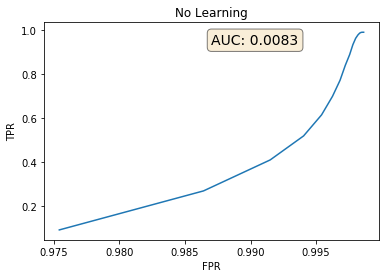

In [77]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur, eff)
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur, eff)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("No Learning")

## Vanilla Embedding

The Pandas Dataframe implementation:

In [69]:
def train_connected_emb(model, train_loader, optimizer, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        spatial = model(data.x)
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
        # Get fake edge list
        candidates = build_edges(spatial, m_configs['r_train'], 20, res)
        e_spatial = torch.cat([candidates, e_bidir], axis=-1)        
                
        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
        df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
        df_merged = df0.merge(df1, how='left', indicator='Exist')

        y_cluster = np.where(df_merged.Exist == 'both', 1, 0)
        
#         y_cluster = data.pid[e_spatial[0]] == data.pid[e_spatial[1]]
        
        hinge = torch.from_numpy(y_cluster).float().to(device)
#         hinge = y_cluster.float()
        hinge[hinge == 0] = -1

        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        total_loss += loss.item()
#         print(i, loss)
        loss.backward()
        optimizer.step()
    
    return total_loss

def evaluate_connected_emb(model, test_loader, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    total_av_nhood_size, total_av_adjacent_nhood_size = 0, 0
    for i, batch in enumerate(test_loader):
        data = batch.to(device)
        spatial = model(data.x)
        e_spatial = build_edges(spatial, m_configs['r_val'], 20, res)  
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])
        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
        df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
        df_merged = df0.merge(df1, how='left', indicator='Exist')

        y_cluster = np.where(df_merged.Exist == 'both', 1, 0)
            
#         y_cluster = data.pid[e_spatial[0]] == data.pid[e_spatial[1]]
    
        hinge = torch.from_numpy(y_cluster).float().to(device)
#         hinge = y_cluster.float()
        hinge[hinge == 0] = -1

        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
#         print("Loss:", loss.item())
        total_loss += loss.item()
        
        #Cluster performance
        cluster_true = 2*len(batch.true_edges[0])
        
        cluster_true_positive = len(df0.merge(df1))
        cluster_positive = len(e_spatial[0])
        
        cluster_total_true_positive += cluster_true_positive
        cluster_total_positive += max(cluster_positive, 1)
        cluster_total_true += cluster_true
#         total_av_adjacent_nhood_size += len(e_adjacent[0]) / len(spatial)
        
#         print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive, "Av nhood size:", len(e_spatial[0])/len(spatial))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

#     print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return cluster_pur, cluster_eff, total_loss


The sparse Scipy implementation

In [4]:
def train_connected_emb(model, train_loader, optimizer, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        spatial = model(data.x)
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
        # Get clustered edge list
        e_spatial = build_edges(spatial, m_configs['r_train'], 100, res)       
        array_size = max(e_spatial.max().item(), e_bidir.max().item()) + 1  
            
        l1 = e_spatial.cpu().numpy()
        l2 = e_bidir.cpu().numpy()
        e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1), shape=(array_size, array_size)).tocsr()
        e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2), shape=(array_size, array_size)).tocsr()
        e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()
                
        e_spatial = torch.from_numpy(np.vstack([e_final.row, e_final.col])).long().to(device)
        y_cluster = e_final.data > 0
        
        e_spatial = torch.cat([e_spatial, e_bidir.transpose(0,1).repeat(1,m_configs['weight']).view(-1, 2).transpose(0,1)], axis=-1) 
        y_cluster = np.concatenate([y_cluster.astype(int), np.ones(e_bidir.shape[1]*m_configs['weight'])])
        
        hinge = torch.from_numpy(y_cluster).float().to(device)
        hinge[hinge == 0] = -1

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])
        d = torch.sum((reference - neighbors)**2, dim=-1)

        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        total_loss += loss.item()
#         print(i, loss)
        loss.backward()
        optimizer.step()
    
    return total_loss

def evaluate_connected_emb(model, test_loader, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    total_av_nhood_size, total_av_adjacent_nhood_size = 0, 0
    for i, batch in enumerate(test_loader):
        data = batch.to(device)
        spatial = model(data.x)
        e_spatial = build_edges(spatial, m_configs['r_val'], 100, res)  
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        array_size = max(e_spatial.max().item(), e_bidir.max().item()) + 1
        
        l1 = e_spatial.cpu().numpy()
        l2 = e_bidir.cpu().numpy()
        e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1), shape=(array_size, array_size)).tocsr()
        e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2), shape=(array_size, array_size)).tocsr()
        e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()
                
        e_spatial = torch.from_numpy(np.vstack([e_final.row, e_final.col])).long().to(device)
        y_cluster = e_final.data > 0
        
        hinge = torch.from_numpy(y_cluster).float().to(device)
        hinge[hinge == 0] = -1

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])
        d = torch.sum((reference - neighbors)**2, dim=-1)
    
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
#         print("Loss:", loss.item())
        total_loss += loss.item()
        
        #Cluster performance
        cluster_true = 2*len(batch.true_edges[0])
        
        cluster_true_positive = y_cluster.sum()
        cluster_positive = len(e_spatial[0])
        
        cluster_total_true_positive += cluster_true_positive
        cluster_total_positive += max(cluster_positive, 1)
        cluster_total_true += cluster_true
#         total_av_adjacent_nhood_size += len(e_adjacent[0]) / len(spatial)
        
#         print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive, "Av nhood size:", len(e_spatial[0])/len(spatial))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

#     print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return cluster_pur, cluster_eff, total_loss


In [29]:
m_configs = {"in_channels": 3, "emb_hidden": 512, "nb_layer": 6, "emb_dim": 64}
other_configs = {"r_train": 1, "r_val": 1, "margin": 1, 'reduction':'mean', 'weight': 1}
model = Embedding(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="LearnedConnections", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=5)

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [30]:
for epoch in range(100):
    tic = tt() 
    model.train()
    train_loss = train_connected_emb(model, train_loader, optimizer, other_configs)
    print('Training loss: {:.4f}'.format(train_loss))

    model.eval()
    with torch.no_grad():
        cluster_pur, cluster_eff, val_loss = evaluate_connected_emb(model, test_loader, other_configs)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "cluster_pur": cluster_pur, "cluster_eff": cluster_eff, "lr": optimizer.param_groups[0]['lr']})
    scheduler.step(val_loss)

    save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'Embedding/'+model_name._name+'.tar')

    print('Epoch: {}, Eff: {:.4f}, Pur: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(epoch, cluster_eff, cluster_pur, val_loss, optimizer.param_groups[0]['lr'], tt()-tic))

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


Training loss: 548.6796
Epoch: 0, Eff: 0.9229, Pur: 0.3018, Loss: 40.3610, LR: 0.001 in time 130.99707102775574
Training loss: 484.7000
Epoch: 1, Eff: 0.9379, Pur: 0.3492, Loss: 41.0979, LR: 0.001 in time 123.08410716056824
Training loss: 456.8347
Epoch: 2, Eff: 0.9381, Pur: 0.3801, Loss: 42.1580, LR: 0.001 in time 120.89246654510498
Training loss: 436.7388
Epoch: 3, Eff: 0.9513, Pur: 0.3915, Loss: 39.5046, LR: 0.001 in time 119.98374962806702
Training loss: 424.9003
Epoch: 4, Eff: 0.9534, Pur: 0.3930, Loss: 39.7366, LR: 0.001 in time 119.81416988372803
Training loss: 416.4181
Epoch: 5, Eff: 0.9534, Pur: 0.4036, Loss: 38.9846, LR: 0.001 in time 119.60432386398315
Training loss: 411.6981
Epoch: 6, Eff: 0.9566, Pur: 0.3951, Loss: 38.4349, LR: 0.001 in time 119.80873084068298
Training loss: 407.4432
Epoch: 7, Eff: 0.9574, Pur: 0.4071, Loss: 38.6341, LR: 0.001 in time 119.56228137016296
Training loss: 404.4339
Epoch: 8, Eff: 0.9568, Pur: 0.4234, Loss: 39.5353, LR: 0.001 in time 119.7618367

KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aab80380710> (for post_run_cell):


KeyboardInterrupt: 

In [31]:
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 1         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |  697474 KB |    8379 MB |  134016 GB |  134015 GB |
|       from large pool |  645814 KB |    8341 MB |  132827 GB |  132827 GB |
|       from small pool |   51660 KB |      88 MB |    1188 GB |    1188 GB |
|---------------------------------------------------------------------------|
| Active memory         |  697474 KB |    8379 MB |  134016 GB |  134015 GB |
|       from large pool |  645814 KB |    8341 MB |  132827 GB |

### ROC Results

Want to get efficiency also, which is number of particles in batch with same PID, under the number of particles in neighbourhood with same PID. Use neighbours and reference with batch.pid

In [5]:
checkpoint = torch.load('../model_comparisons/Embedding/stellar-wood-78.tar')
checkpoint['config']

{'in_channels': 3,
 'emb_hidden': 512,
 'nb_layer': 6,
 'emb_dim': 64,
 'r_train': 1,
 'r_val': 1,
 'margin': 1,
 'reduction': 'mean',
 'weight': 1}

In [6]:
m_configs = {"in_channels": 3, "emb_hidden": 512, "nb_layer": 6, "emb_dim": 64}
other_configs = {"r_train": 1, "r_val": 1, "margin": 1, 'reduction':'mean'}
model = Embedding(**m_configs).to(device)
m_configs.update(other_configs)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=5)

optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [51]:
%%time

r_min, r_max, r_step = 0.1, 2., 0.1
pur, eff, f1 = evaluate_embedding_f1(test_loader, model, r_min, r_max, r_step)

CPU times: user 9min 56s, sys: 1min 45s, total: 11min 42s
Wall time: 11min 9s


In [35]:
pur, eff

(array([0.53304543, 0.64529477, 0.63555615, 0.60163938, 0.54146017,
        0.43119134, 0.34477449, 0.26520299, 0.18167424, 0.11469745,
        0.07134259, 0.04825373, 0.03694588, 0.03117183, 0.02794266]),
 array([0.35841336, 0.7067303 , 0.84201364, 0.90896253, 0.94079085,
        0.96253713, 0.97611485, 0.98321575, 0.98669506, 0.98863521,
        0.98994323, 0.99089768, 0.99150107, 0.99183765, 0.99202975]))

Text(0.5, 1.0, 'Biadjacent Embedding')

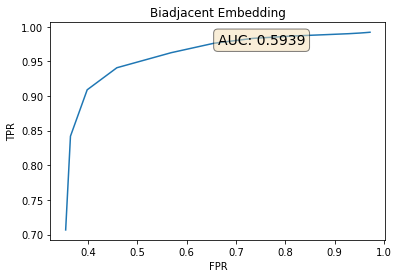

In [36]:
max_ind = np.argmax(pur)

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-pur[max_ind:], eff[max_ind:])
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-pur[max_ind:], eff[max_ind:])), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("Biadjacent Embedding")

### F1 Results

In [7]:
def evaluate_embedding_f1(test_loader, model, r_min, r_max, r_step):
    
    model.eval()
    
    total_true_positive, total_positive, total_true = np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float), np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float), np.zeros(int(np.ceil((r_max - r_min)/r_step)), dtype=np.float)

    for batch in test_loader:

        data = batch.to(device)
        spatial = model(data.x)

        for i, r in enumerate(np.arange(r_min, r_max, r_step)):    
    #         e = radius_graph(emb_feats, r=r, batch=batch.batch, loop=False, max_num_neighbors=5000)

            e_spatial = build_edges(spatial, r, 100, res)
            e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
            array_size = max(e_spatial.max().item(), e_bidir.max().item()) + 1
        
            l1 = e_spatial.cpu().numpy()
            l2 = e_bidir.cpu().numpy()
            e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1), shape=(array_size, array_size)).tocsr()
            e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2), shape=(array_size, array_size)).tocsr()
            e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()

            e_spatial = torch.from_numpy(np.vstack([e_final.row, e_final.col])).long().to(device)
            y = e_final.data > 0

            true = 2*len(batch.true_edges[0])
            true_positive = y.sum()
            positive = len(e_spatial[0])

#             print("True:", true, "Positive:", positive, "True Positive:", true_positive)
            
            total_positive[i] += positive
            total_true[i] += true
            total_true_positive[i] += true_positive

    pur, eff = total_true_positive / total_positive, total_true_positive / total_true
    f1 = 2*pur*eff/(pur+eff)
    return pur, eff, f1

In [39]:
%%time

r_min, r_max, r_step = 0.5, 1.5, 0.1
pur, eff, f1 = evaluate_embedding_f1(test_loader, model, r_min, r_max, r_step)

CPU times: user 1min 40s, sys: 10.2 s, total: 1min 51s
Wall time: 1min 23s


Text(0.5, 1.0, 'Biadjacent Embedding')

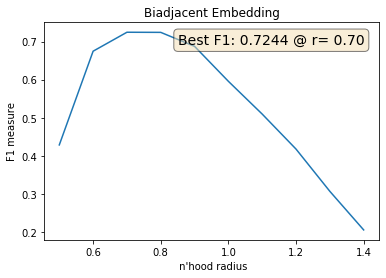

In [41]:
fig, ax = plt.subplots()
ax.plot(np.arange(r_min, r_max, r_step), f1)
ax.text(0.4, 0.95, "Best F1: {:.4f} @ r= {:.2f}".format(max(f1), r_min+r_step*np.argmax(f1)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel(" n'hood radius"), ax.set_ylabel("F1 measure")
ax.set_title("Biadjacent Embedding")

### V-measure Results

In [18]:
%%time

homogeneity, completeness = evaluate_embedding_vmeasure(test_loader, model, 0.01, 3., 0.1)

CPU times: user 27.4 s, sys: 20 ms, total: 27.4 s
Wall time: 27.5 s


Text(0.5, 1.0, 'Biadjacent Embedding')

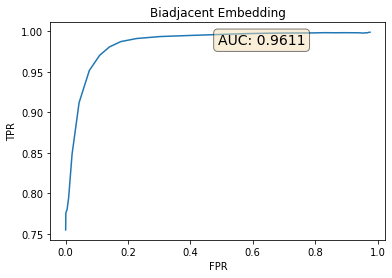

In [20]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-homogeneity, completeness)
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-homogeneity, completeness)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("Biadjacent Embedding")

In [57]:
%%time
model.eval()
correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0

for batch in test_loader[:10]:
    data = batch.to(device)
    spatial = model(data.x)

    e_spatial = build_edges(spatial, 1, 100, res)
    
#     embedded = spatial.cpu().detach().numpy()
#     pca = PCA(n_components=2)
#     pca_result = pca.fit_transform(embedded)
#     plt.figure(figsize=(16,10))
#     plt.scatter(pca_result[:,0], pca_result[:,1])

TypeError: 'DataLoader' object is not subscriptable

### Visualisation

In [116]:
data = test_dataset[0]
data = data.to(device)
spatial = model(data.x)

e_spatial = build_edges(spatial, 1, 100, res)

# embedded = spatial.cpu().detach().numpy()
# pca = PCA(n_components=3)
# pca_result = pca.fit_transform(embedded)
# plt.figure(figsize=(16,10))
# plt.scatter(pca_result[:,0], pca_result[:,1])
# plt.scatter(pca_result[:,0], pca_result[:,2])
# plt.scatter(pca_result[:,1], pca_result[:,2])

In [117]:
e_bidir = torch.cat([data.true_edges.to(device), 
                               torch.stack([data.true_edges[1], data.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
df_merged = df0.merge(df1, how='left', indicator='Exist')

y = np.where(df_merged.Exist == 'both', 1, 0)

In [118]:
y.sum()

88228

In [119]:
e_spatial.shape

torch.Size([2, 274166])

In [82]:
(data.pid[e_spatial[0]] == data.pid[e_spatial[1]] ).sum()

tensor(172510, device='cuda:0')

In [155]:
embedded = spatial.cpu().detach().numpy()
pca = PCA(n_components=3)
px = pca.fit_transform(embedded)

In [ ]:
R = np.sqrt(data.x[:,0]**2 + data.x[:,2]**2)
e_uni = e_spatial[:, R[e_spatial[1]] > R[e_spatial[0]]]

In [ ]:
edge_build = []
initial = np.random.choice(e[0])
source_idx = e_uni[0] == initial
edge_build.append(source_idx)
for i in range(3):
    targets = e_uni[1, source_idx]
    source_idx = np.isin(e_uni[0], targets)
    edge_build.append(source_idx)

(9.581162452697754, 12.410853385925293)

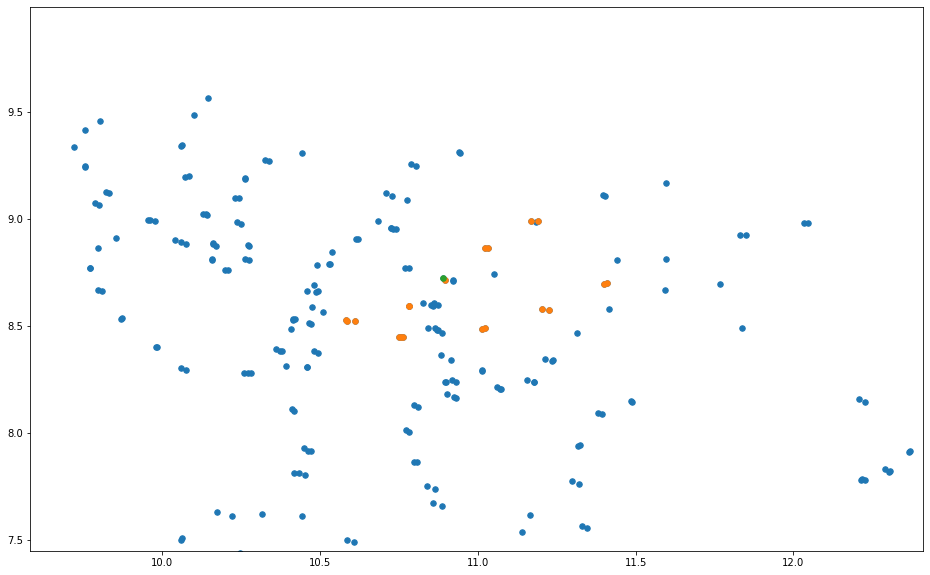

In [157]:
plt.figure(figsize=(16,10))
plt.scatter(px[:,0], px[:,1], s=30)
source = np.random.choice(e_spatial[0].cpu())
targets = e_spatial[1, e_spatial[0,:] == source].cpu()
plt.scatter(px[targets,0], px[targets,1], s=30)
plt.scatter(px[source,0], px[source,1], s=30)
plt.ylim(min(px[targets,1])-1, max(px[targets,1])+1)
plt.xlim(min(px[targets,0])-1, max(px[targets,0])+1)

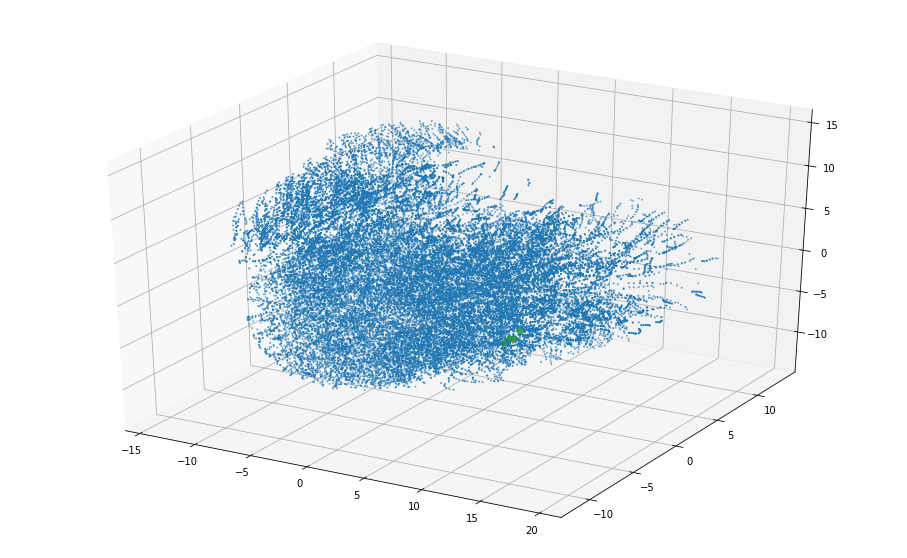

In [133]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1], s=1)

ax.scatter(px[source,0], px[source,1], px[source,2], s=30)
targets = e_spatial[1, e_spatial[0,:] == source].cpu()
ax.scatter(px[targets,0], px[targets,1], px[targets,2], s=30)

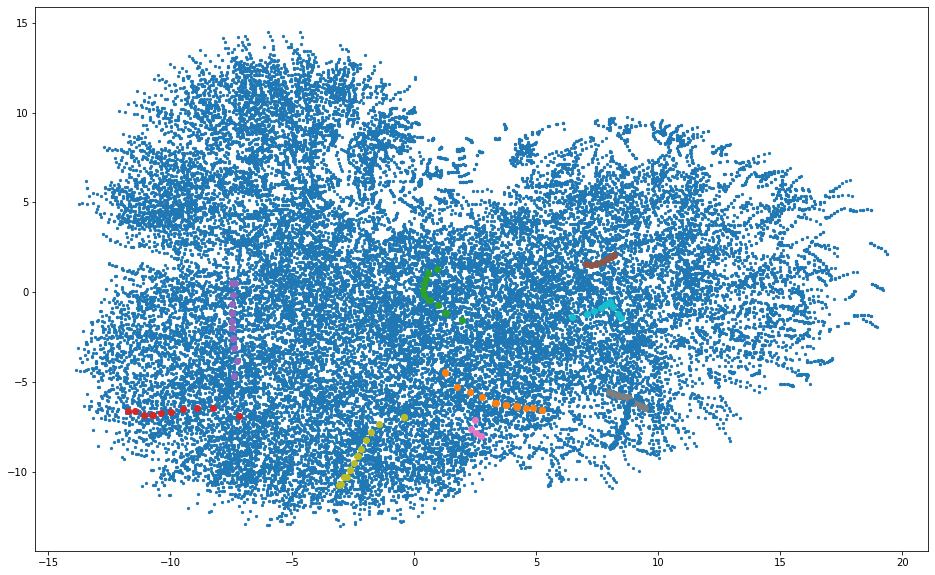

In [134]:
plt.figure(figsize=(16,10))
plt.scatter(px[:,0], px[:,1], s=5)
for P in data.pid.unique()[10:20]:
    Pmask = (data.pid == P).cpu()
    plt.scatter(px[Pmask,0], px[Pmask,1])

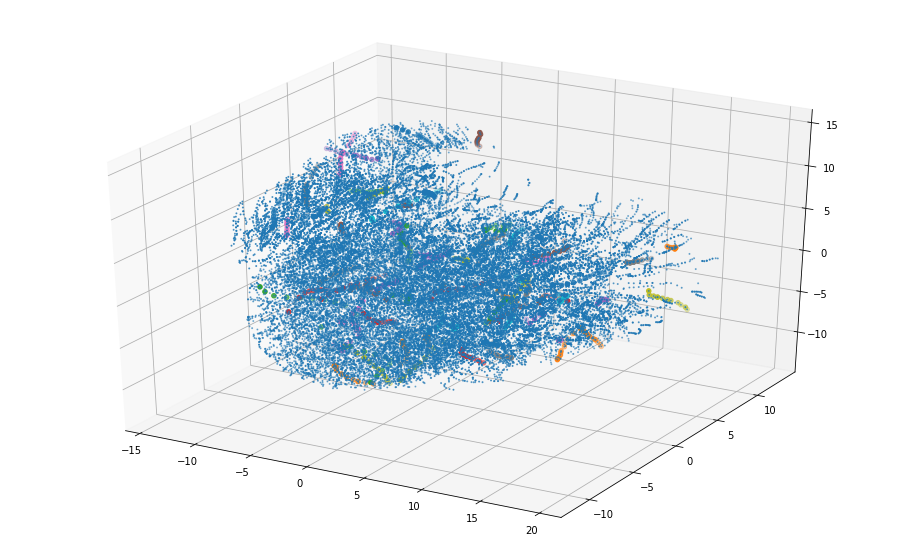

In [142]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(px[:,0], px[:,2], px[:,1], s=1)
for P in data.pid.unique()[::50]:
    Pmask = (data.pid == P).cpu()
    ax.scatter(px[Pmask,0], px[Pmask,2], px[Pmask,1])

### Density Performance

We filter out random particle IDs, to simulate a transition between high/low luminosity environment. The different densities are **trained on**, and we report efficiency, purity and timings.

In [53]:
# Get events to average over
batches = test_dataset[0:100]

In [54]:
%%time
pts, truths = fetch_truths(batches)

CPU times: user 12.4 s, sys: 2.01 s, total: 14.4 s
Wall time: 20.2 s


In [55]:
truths = [truth.assign(pt=pt) for (truth, pt) in zip(truths, pts)]

In [15]:
all_truths = pd.concat(truths, ignore_index=True, sort=False)

In [18]:
fig = px.histogram(all_truths, x="pt", log_y=True, log_x=False)
fig.update_xaxes(range=[0.4, 6])
fig.show()

### pT Performance

We filter out node indices that are within a pT bracket, and report efficiency & purity for each bracket. Afterwards, we correct for unbalance between pT brackets, i.e. performance may be affected by high populations of low/high pT hits.

In [66]:
%%time

bins_min, bins_max, bins_step = 0.5, 1.5, 0.05
bins = np.arange(bins_min, bins_max, bins_step)
bin_centres = np.arange(bins_min + (bins_step/2), bins_max - (bins_step/2), bins_step)
total_true_positive, total_positive, total_true = np.zeros(int(np.ceil((bins_max - bins_min)/bins_step))-1, dtype=np.float), np.zeros(int(np.ceil((bins_max - bins_min)/bins_step))-1, dtype=np.float), np.zeros(int(np.ceil((bins_max - bins_min)/bins_step))-1, dtype=np.float)

model.eval()

for (batch, pt) in zip(batches, pts):

    data = batch.to(device)
    spatial = model(data.x)
    e_pred = build_edges(spatial, 1.1, 100, res).cpu().numpy()
    e_true = torch.cat([batch.true_edges.to(device), 
                       torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1).cpu().numpy() 
    array_size = np.max([np.max(e_pred), np.max(e_true)]) + 1
   
    for i, min_pt, max_pt in zip(range(len(bins)-1), bins[:-1], bins[1:]):
        hits_bracket = (pt > min_pt) & (pt < max_pt)
        e_true_filter = e_true[:, hits_bracket[e_true[0]]]
        e_pred_filter = e_pred[:, hits_bracket[e_pred[0]]]

        l1 = e_pred_filter
        l2 = e_true_filter
        e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1), shape=(array_size, array_size)).tocsr()
        e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2), shape=(array_size, array_size)).tocsr()
        e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()

        e_spatial = np.vstack([e_final.row, e_final.col])
        y = e_final.data > 0

        true = e_true_filter.shape[1]
        true_positive = y.sum()
        positive = len(e_pred_filter[0])
        
        total_positive[i] += positive
        total_true[i] += true
        total_true_positive[i] += true_positive

#         print(true_positive, true, positive)

#         print("Bin centre:", (min_pt + max_pt)/2, "Eff:", true_positive/true)

pur, eff = total_true_positive / total_positive, total_true_positive / total_true
f1 = 2*pur*eff/(pur+eff)

CPU times: user 25.8 s, sys: 1.73 s, total: 27.6 s
Wall time: 25.9 s


In [67]:
fig = px.line(x=bin_centres[:len(eff)], y=eff)
fig.update_yaxes(range=[0.9, 1])
fig.show()

In [70]:
fig = px.line(x=bin_centres[:len(pur)], y=pur)
fig.update_yaxes(range=[0.3, 0.4])
fig.show()

In [71]:
fig = px.line(x=bin_centres[:len(f1)], y=f1)
fig.update_yaxes(range=[0.45, 0.6])
fig.show()

### Geometry Performance

### Cluster Performance

In [193]:
%%time

homogeneity, completeness = evaluate_embedding_vmeasure(test_loader, 0.01, 3., 0.1)

CPU times: user 48.6 s, sys: 581 ms, total: 49.1 s
Wall time: 48 s


Text(0.5, 1.0, 'All-Layer Embedding')

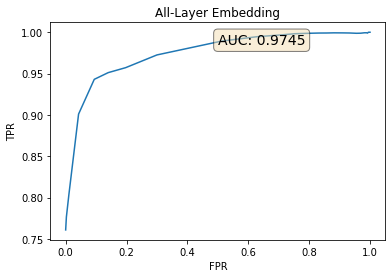

In [195]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots()
ax.plot(1-homogeneity, completeness)
ax.text(0.5, 0.95, "AUC: {:.4f}".format(auc(1-homogeneity, completeness)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("FPR"), ax.set_ylabel("TPR")
ax.set_title("All-Layer Embedding")

## Pyramid Architecture

In [31]:
def train_connected_emb(model, train_loader, optimizer, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    correct, total, total_loss = 0, 0, 0
    send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time = 0, 0, 0, 0, 0, 0, 0
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        tic = tt()
        data = batch.to(device)
        send_time += tt() - tic
        tic = tt()
        spatial = model(data.x)
        pred_time += tt() - tic
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
        # Get fake edge list
        tic = tt()
        candidates = build_edges(spatial, m_configs['r_train'], 20, res)
        e_spatial = torch.cat([candidates, e_bidir], axis=-1)        
        cluster_time += tt() - tic
        
        
        tic = tt()
#         df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
#         df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
#         df_merged = df0.merge(df1, how='left', indicator='Exist')
        
        l1 = e_spatial.cpu().numpy()
        l2 = e_bidir.cpu().numpy()
        e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1)).tocsr()
        e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2)).tocsr()
        e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()
        
        merge_time += tt() - tic
        
        e_spatial = torch.from_numpy(np.vstack([e_final.row, e_final.col])).long().to(device)
        y_cluster = e_final.data > 0
        
#         y_cluster = np.where(df_merged.Exist == 'both', 1, 0)
#         y_cluster = data.pid[e_spatial[0]] == data.pid[e_spatial[1]]
        tic = tt()
        hinge = torch.from_numpy(y_cluster).float().to(device)
#         hinge = y_cluster.float()
        hinge[hinge == 0] = -1

        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])

        d = torch.sum((reference - neighbors)**2, dim=-1)
    
        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
        total_loss += loss.item()
        loss_time += tt() - tic
#         print(i, loss)
        tic = tt()
        loss.backward()
        backprop_time += tt() - tic
        optimizer.step()
    
    print("send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time")
    print(send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time)
    return total_loss

def evaluate_connected_emb(model, test_loader, m_configs):
    edge_correct, edge_total_positive, edge_total_true, edge_true_positive, total = 0, 1, 0, 0, 0
    cluster_correct, cluster_total_positive, cluster_total_true, cluster_total_true_positive, cluster_total = 0, 1, 0, 0, 0
    total_loss = 0
    total_av_nhood_size, total_av_adjacent_nhood_size = 0, 0
    for i, batch in enumerate(test_loader):
        data = batch.to(device)
        spatial = model(data.x)
        e_spatial = build_edges(spatial, m_configs['r_val'], 20, res)  
        e_bidir = torch.cat([batch.true_edges.to(device), 
                               torch.stack([batch.true_edges[1], batch.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
        reference = spatial.index_select(0, e_spatial[1])
        neighbors = spatial.index_select(0, e_spatial[0])
        d = torch.sum((reference - neighbors)**2, dim=-1)
        
        df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
        df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
        df_merged = df0.merge(df1, how='left', indicator='Exist')

        y_cluster = np.where(df_merged.Exist == 'both', 1, 0)
            
#         y_cluster = data.pid[e_spatial[0]] == data.pid[e_spatial[1]]
    
        hinge = torch.from_numpy(y_cluster).float().to(device)
#         hinge = y_cluster.float()
        hinge[hinge == 0] = -1

        loss = torch.nn.functional.hinge_embedding_loss(d, hinge, margin=m_configs["margin"], reduction=m_configs["reduction"])
#         print("Loss:", loss.item())
        total_loss += loss.item()
        
        #Cluster performance
        cluster_true = 2*len(batch.true_edges[0])
        
        cluster_true_positive = len(df0.merge(df1))
        cluster_positive = len(e_spatial[0])
        
        cluster_total_true_positive += cluster_true_positive
        cluster_total_positive += max(cluster_positive, 1)
        cluster_total_true += cluster_true
#         total_av_adjacent_nhood_size += len(e_adjacent[0]) / len(spatial)
        
#         print("CLUSTER:", "True positive:", cluster_true_positive, "True:", cluster_true, "Positive:", cluster_positive, "Av nhood size:", len(e_spatial[0])/len(spatial))

    cluster_eff = (cluster_total_true_positive / max(cluster_total_true, 1))
    cluster_pur = (cluster_total_true_positive / max(cluster_total_positive, 1))

#     print('CLUSTER Purity: {:.4f}, Efficiency: {:.4f}'.format(cluster_pur, cluster_eff))
    
    return cluster_pur, cluster_eff, total_loss


In [19]:
class PyramidEmbedding(torch.nn.Module):
    def __init__(self, in_channels, emb_hidden, nb_layer, emb_dim=3):
        super(PyramidEmbedding, self).__init__()
        layers = [Linear(in_channels, (2**(nb_layer//2))*emb_hidden)]
        ln = [Linear(int((2**(nb_layer//2-i))*emb_hidden), int((2**(nb_layer//2-(i+1)))*emb_hidden)) for i in range(nb_layer)]
        layers.extend(ln)
        self.layers = nn.ModuleList(layers)
        self.emb_layer = nn.Linear(int((2**(nb_layer//2 - nb_layer))*emb_hidden), emb_dim)
        self.norm = torch.nn.LayerNorm(int((2**(nb_layer//2 - nb_layer))*emb_hidden))
        self.act = nn.Tanh()
        # self.dropout = nn.Dropout(p=0.7)
#         self.mean = torch.FloatTensor(mean).to(torch.float)
#         self.std = torch.FloatTensor(std).to(torch.float)

    def forward(self, x):
#         hits = self.normalize(hits)
        for l in self.layers:
            x = l(x)
            x = self.act(x)
            # hits = self.dropout(hits)
        x = self.norm(x) #Option of LayerNorm
        x = self.emb_layer(x)
        return x

In [20]:
m_configs = {"in_channels": 3, "emb_hidden": 128, "nb_layer": 5, "emb_dim": 64}
other_configs = {"r_train": 1, "r_val": 1, "margin": 1, 'reduction':'mean'}
model = PyramidEmbedding(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="LearnedConnections", group="Pyramid", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [21]:
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])

In [22]:
model

PyramidEmbedding(
  (layers): ModuleList(
    (0): Linear(in_features=3, out_features=512, bias=True)
    (1): Linear(in_features=512, out_features=256, bias=True)
    (2): Linear(in_features=256, out_features=128, bias=True)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): Linear(in_features=64, out_features=32, bias=True)
    (5): Linear(in_features=32, out_features=16, bias=True)
  )
  (emb_layer): Linear(in_features=16, out_features=64, bias=True)
  (norm): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
  (act): Tanh()
)

In [23]:
params

178256

In [32]:
for epoch in range(100):
    tic = tt() 
    model.train()
    train_loss = train_connected_emb(model, train_loader, optimizer, other_configs)
    print('Training loss: {:.4f}'.format(train_loss))

    model.eval()
    with torch.no_grad():
        cluster_pur, cluster_eff, val_loss = evaluate_connected_emb(model, test_loader, other_configs)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "cluster_pur": cluster_pur, "cluster_eff": cluster_eff, "lr": optimizer.param_groups[0]['lr']})
    scheduler.step(val_loss)

    save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'Embedding/'+model_name._name+'.tar')

    print('Epoch: {}, Eff: {:.4f}, Pur: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(epoch, cluster_eff, cluster_pur, val_loss, optimizer.param_groups[0]['lr'], tt()-tic))

ERROR:wandb.jupyter:Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.4 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time
2.939805746078491 0.7188806533813477 42.080671310424805 0 30.631474494934082 2.2908270359039307 2.287076234817505
Training loss: 649.5055
Epoch: 0, Eff: 0.9022, Pur: 0.3502, Loss: 44.3758, LR: 0.001 in time 104.3025062084198
send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time
2.605969190597534 0.7081294059753418 41.54855513572693 0 25.77099370956421 1.8479502201080322 1.5092501640319824
Training loss: 596.5559
Epoch: 1, Eff: 0.9031, Pur: 0.3896, Loss: 45.6500, LR: 0.001 in time 95.68771624565125
send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time
2.5490803718566895 0.7058069705963135 41.130863189697266 0 25.10687279701233 1.7643680572509766 1.550532579421997
Training loss: 575.6142
Epoch: 2, Eff: 0.9102, Pur: 0.4056, Loss: 44.6388, LR: 0.001 in time 94.1058042049408
send_time, pred_time, cluster_time, df_time, merge_time, loss_time, backprop_time

KeyboardInterrupt: 

Error in callback <function _init_jupyter.<locals>.cleanup at 0x2aab804ba680> (for post_run_cell):


KeyboardInterrupt: 

In [18]:
%%time

r_min, r_max, r_step = 0.8, 1.5, 0.05
pur, eff, f1 = evaluate_embedding_f1(test_loader, model, r_min, r_max, r_step)

CPU times: user 3min 33s, sys: 12.3 s, total: 3min 45s
Wall time: 3min 22s


In [19]:
pur, eff

(array([0.59416704, 0.56950096, 0.53800744, 0.49364802, 0.43026187,
        0.37825663, 0.34257336, 0.3097995 , 0.2777702 , 0.2466306 ,
        0.2168145 , 0.18884604, 0.16282146, 0.13904481]),
 array([0.91572845, 0.93291515, 0.94486034, 0.95402446, 0.96209852,
        0.96845242, 0.97296936, 0.97656514, 0.97964947, 0.98224945,
        0.98450028, 0.98639512, 0.98784467, 0.98896057]))

In [20]:
2*(pur*eff)/(pur+eff)

array([0.72070638, 0.70725556, 0.68561999, 0.65063374, 0.59460799,
       0.54402775, 0.50673137, 0.4703789 , 0.43281879, 0.39426593,
       0.3553672 , 0.31700185, 0.27956383, 0.2438106 ])

In [33]:
%%time
data = test_dataset[0]
data = data.to(device)
spatial = model(data.x)

CPU times: user 0 ns, sys: 3.68 ms, total: 3.68 ms
Wall time: 3.39 ms


In [58]:
%%time
e_spatial = build_edges(spatial, 1, 100, res)

CPU times: user 61.5 ms, sys: 3.8 ms, total: 65.3 ms
Wall time: 55 ms


In [62]:
e_bidir = torch.cat([data.true_edges.to(device), 
                               torch.stack([data.true_edges[1], data.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
candidates = build_edges(spatial, m_configs['r_train'], 20, res)
e_spatial = torch.cat([candidates, e_bidir], axis=-1) 

In [63]:
%%time
# e_bidir = torch.cat([data.true_edges.to(device), 
#                                torch.stack([data.true_edges[1], data.true_edges[0]], axis=1).T.to(device)], axis=-1) 
        
df0 = pd.DataFrame(e_spatial.cpu().numpy().T)
df1 = pd.DataFrame(e_bidir.cpu().numpy().T)
df_merged = df0.merge(df1, how='left', indicator='Exist')

y = np.where(df_merged.Exist == 'both', 1, 0)

CPU times: user 82.7 ms, sys: 120 µs, total: 82.8 ms
Wall time: 81.5 ms


In [64]:
e_spatial.shape

torch.Size([2, 297183])

In [65]:
y.sum()

182074

In [53]:
%%time
l1 = e_spatial.cpu().numpy()
l2 = e_bidir.cpu().numpy()

CPU times: user 2.48 ms, sys: 0 ns, total: 2.48 ms
Wall time: 1.77 ms


#### With Scipy

In [54]:
%%time
e_1 = sp.sparse.coo_matrix((np.ones(l1.shape[1]), l1)).tocsr()
e_2 = sp.sparse.coo_matrix((np.ones(l2.shape[1]), l2)).tocsr()

CPU times: user 15.3 ms, sys: 0 ns, total: 15.3 ms
Wall time: 14.6 ms


In [49]:
e_1>1

<38954x38954 sparse matrix of type '<class 'numpy.bool_'>'
	with 87144 stored elements in Compressed Sparse Row format>

In [55]:
%%time
e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()

CPU times: user 11.8 ms, sys: 0 ns, total: 11.8 ms
Wall time: 10.7 ms


In [56]:
%%time
e_new_spatial = np.vstack([e_final.row, e_final.col])
y = e_final.data > 0

CPU times: user 1e+03 µs, sys: 0 ns, total: 1e+03 µs
Wall time: 1.01 ms


In [57]:
y.sum()

94930

#### With Cupy

In [41]:
import cupy as cp
import cupyx.scipy as cpx

In [37]:
%%time
c1 = cp.asarray(l1)
c2 = cp.asarray(l2)

CPU times: user 4.36 ms, sys: 0 ns, total: 4.36 ms
Wall time: 3.06 ms


In [38]:
%%time
c1 = cp.asarray(e_spatial)
c2 = cp.asarray(e_bidir)

CPU times: user 0 ns, sys: 153 µs, total: 153 µs
Wall time: 156 µs


In [79]:
%%time
c1_coo = cpx.sparse.coo_matrix((cp.asarray(np.ones(c1.shape[1])), (c1[0], c1[1])))
c2_coo = cpx.sparse.coo_matrix((cp.asarray(np.ones(c2.shape[1])), (c2[0], c2[1])))

CPU times: user 6.2 ms, sys: 0 ns, total: 6.2 ms
Wall time: 4.7 ms


In [109]:
%%time
c_prod = c1_coo + c2_coo

CPU times: user 21.1 ms, sys: 0 ns, total: 21.1 ms
Wall time: 19.3 ms


In [107]:
%%time
c_prod.tocoo().data > 1

CPU times: user 3.34 ms, sys: 0 ns, total: 3.34 ms
Wall time: 3.61 ms


array([False, False, False, ..., False,  True, False])

In [26]:
%%time
e_final = (e_1.multiply(e_2) - ((e_1 - e_2)>0)).tocoo()

CPU times: user 14.1 ms, sys: 512 µs, total: 14.7 ms
Wall time: 13.3 ms


In [63]:
%%time
ones = cp.array([1]*c1.shape[1])

CPU times: user 26.5 ms, sys: 228 µs, total: 26.8 ms
Wall time: 25.7 ms


In [66]:
%%time


CPU times: user 0 ns, sys: 3.6 ms, total: 3.6 ms
Wall time: 7.23 ms


array([1., 1., 1., ..., 1., 1., 1.])

In [60]:
%%time
cpx.sparse.coo_matrix(c1.shape)

CPU times: user 69 µs, sys: 0 ns, total: 69 µs
Wall time: 72.5 µs


#### With TorchSparse

In [185]:
from torch_sparse import SparseTensor

In [ ]:
SparseTensor(row=row, col=torch.arange(row.size(0), dtype=torch.long, device=row.device), sparse_sizes=(N+1, row.size(0)))

## Filter Model

First, we prepare the data to be trained on

In [44]:
r = 2.7
step = int((r-r_min)/r_step)
pur[step], eff[step]

(0.17959065291190138, 0.9946552177341628)

In [ ]:
embedding_model = model

In [42]:
filter_train_dataset = [classify_event(model, batch, r=1.4) for batch in train_loader]
filter_test_dataset = [classify_event(model, batch, r=1.4) for batch in test_loader]

In [43]:
filter_train_loader = DataLoader(filter_train_dataset, batch_size=1, shuffle=True)
filter_test_loader = DataLoader(filter_test_dataset, batch_size=1, shuffle=True)

In [ ]:
plt.figure(figsize=(20,10))
x, e, pid = filter_train_dataset[0].x.cpu().numpy(), filter_train_dataset[0].e.cpu().numpy(), filter_train_dataset[0].pid.cpu().numpy()
y = pid[e[0]] == pid[e[1]]
fig = plt.plot([x[e[0,~y], 0], x[e[1,~y], 0]], [x[e[0,~y], 1], x[e[1,~y], 1]] , color='r')
fig = plt.plot([x[e[0,y], 0], x[e[1,y], 0]], [x[e[0,y], 1], x[e[1,y], 1]] , color='k')

### Model Def

In [44]:
class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, nb_layer=4, hidden_dim=8, hidden_activation=torch.nn.Tanh,
                 layer_norm=True):
        super(EdgeNetwork, self).__init__()
        self.network = make_mlp(input_dim*2,
                                [hidden_dim]*nb_layer + [1],
                                hidden_activation=hidden_activation,
                                output_activation=None,
                                layer_norm=layer_norm)

    def forward(self, x, edge_index):
        # Select the features of the associated nodes
        start, end = edge_index
        x1, x2 = x[start], x[end]
        edge_inputs = torch.cat([x[start], x[end]], dim=1)
        return self.network(edge_inputs).squeeze(-1)

class Edge_MLP(nn.Module):
    def __init__(self, in_channels, emb_hidden, nb_layer, emb_dim=3):
        super(Edge_MLP, self).__init__()

        self.input_layer = nn.Linear(in_channels, emb_hidden)
        self.edge_network = EdgeNetwork(emb_hidden, nb_layer, emb_hidden)
        self.final_layer = nn.Linear(emb_hidden, 1)
        self.norm = torch.nn.LayerNorm(emb_hidden)
        
    def forward(self, data):
        x = self.input_layer(data.x)
        x = self.norm(x)
        e = self.edge_network(x, data.e)
        return e

In [45]:
sig = torch.nn.Sigmoid()

def train_filter(model, filter_train_loader, optimizer, m_configs):
    correct = 0
    total = 0
    total_loss = 0
    for i, batch in enumerate(filter_train_loader):
        optimizer.zero_grad()
        data = batch.to(device)
        pred = model(data)
              
        y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]
                
        loss = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(m_configs["weight"]))
        
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total += true.sum().item()
    acc = correct/total
    return acc, total_loss

def evaluate_filter(model, filter_test_loader, m_configs):
    correct, total_positive, total_true, true_positive, total, total_loss = 0, 1, 0, 0, 0, 0
    
    for batch in filter_test_loader:
        data = batch.to(device)
        pred = model(data)
              
        y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]
                
        loss = F.binary_cross_entropy_with_logits(pred.float(), y.float(), pos_weight=torch.tensor(m_configs["weight"]))
        total_loss += loss.item()
        
        true, false = y.float() > 0.5, y.float() < 0.5
        positive, negative = sig(pred) > 0.5, sig(pred) < 0.5
        true_positive += (true & positive).sum().item()
        total_positive += max(positive.sum().item(), 1)
        
        correct += ((sig(pred) > 0.5) == (y.float() > 0.5)).sum().item()
        total_true += max(true.sum().item(), 1)
        
#         print("True positive:", (true & positive).sum().item(), "True:", true.sum().item(), "Positive", positive.sum().item())
        
        total += len(pred)

    eff = (true_positive / total_true)
    pur = (true_positive / total_positive)
        
    return eff, pur, total_loss

### Train & Evaluate

In [65]:
m_configs = {"in_channels": 3, "emb_hidden": 128, "nb_layer": 3, "emb_dim": 8}
other_configs = {"weight": 1}
model = Edge_MLP(**m_configs).to(device)
m_configs.update(other_configs)
model_name = wandb.init(project="GravNet", group="AdjacentEmbedding", config=m_configs)
wandb.watch(model, log='all')
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-3, amsgrad=True)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.3, patience=10)

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.1 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [ ]:
for epoch in range(100):
    tic = tt() 
    model.train()
    pur, train_loss = train_filter(model, filter_train_loader, optimizer, m_configs)
    print('Training loss: {:.4f}'.format(train_loss))

    model.eval()
    with torch.no_grad():
        eff, pur, val_loss = evaluate_filter(model, filter_test_loader, m_configs)
    wandb.log({"val_loss": val_loss, "train_loss": train_loss, "edge_pur": pur, "edge_eff": eff, "lr": optimizer.param_groups[0]['lr']})
    scheduler.step(val_loss)

    save_model(epoch, model, optimizer, scheduler, val_loss, m_configs, 'Embedding/'+model_name._name+'.tar')

    print('Epoch: {}, Eff: {:.4f}, Pur: {:.4f}, Loss: {:.4f}, LR: {} in time {}'.format(epoch, eff, pur, val_loss, optimizer.param_groups[0]['lr'], tt()-tic))

### Results

In [61]:
model.eval()

total_pred = []
total_y = []

for batch in filter_test_loader:
    data = batch.to(device)
    pred = model(data)   
    y = batch.pid[batch.e[0]] == batch.pid[batch.e[1]]

    total_pred += pred.detach().cpu().numpy().tolist()
    total_y += y.cpu().numpy().tolist()

In [62]:
fpr, tpr, _ = metrics.roc_curve(total_y, total_pred)

In [ ]:
list(zip(fpr[tpr>0.99], tpr[tpr>0.99]))

Text(0.5, 1.0, 'Filter over Biadjacent Embedding')

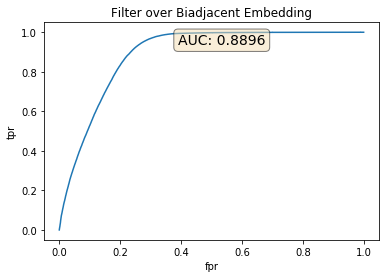

In [63]:
fig, ax = plt.subplots()
ax.plot(fpr, tpr)
ax.text(0.4, 0.95, "AUC: {:.4f}".format(metrics.roc_auc_score(total_y, total_pred)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax.set_xlabel("fpr"), ax.set_ylabel("tpr")
ax.set_title("Filter over Biadjacent Embedding")

For the case of pT>1GeV, filter doesn't seem to have much effect.